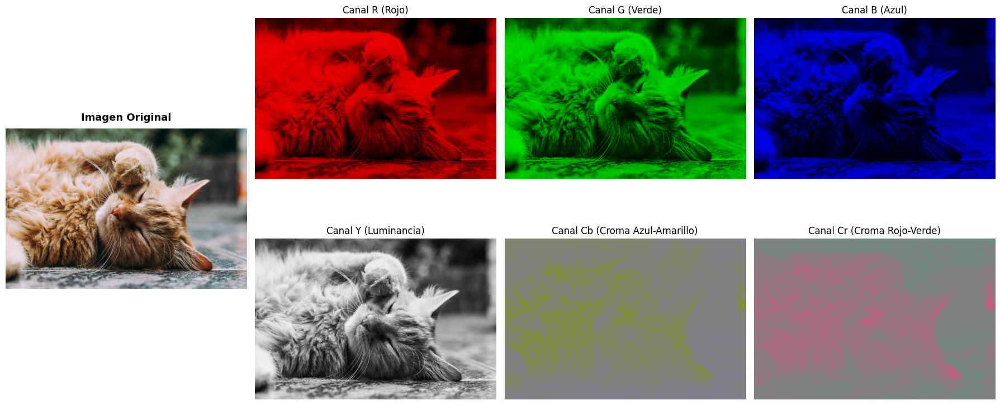

In [10]:
import cv2
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import numpy as np

def comparar_rgb_ycrcb_limpio(ruta_imagen):
    # 1. Cargar y convertir imagen
    img_bgr = cv2.imread(ruta_imagen)
    if img_bgr is None:
        print(f"Error: No se pudo cargar la imagen desde {ruta_imagen}")
        return

    img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
    
    # -------------------------------------------------
    # EXTRACCIÓN Y COLORIZACIÓN RGB
    # -------------------------------------------------
    R, G, B = cv2.split(img_rgb)
    zeros = np.zeros_like(R)
    
    img_R_color = cv2.merge([R, zeros, zeros])
    img_G_color = cv2.merge([zeros, G, zeros])
    img_B_color = cv2.merge([zeros, zeros, B])

    # -------------------------------------------------
    # EXTRACCIÓN Y COLORIZACIÓN YCbCr
    # -------------------------------------------------
    img_ycrcb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2YCrCb)
    Y, Cr, Cb = cv2.split(img_ycrcb)

    Y_medio = np.full_like(Y, 128)
    Cr_neutro = np.full_like(Cr, 128)
    Cb_neutro = np.full_like(Cb, 128)

    img_Cb_aislado = cv2.merge([Y_medio, Cr_neutro, Cb])
    img_Cb_color = cv2.cvtColor(img_Cb_aislado, cv2.COLOR_YCrCb2RGB)

    img_Cr_aislado = cv2.merge([Y_medio, Cr, Cb_neutro])
    img_Cr_color = cv2.cvtColor(img_Cr_aislado, cv2.COLOR_YCrCb2RGB)

    # -------------------------------------------------
    # VISUALIZACIÓN CON GRIDSPEC (Imagen Original a la Izquierda)
    # -------------------------------------------------
    fig = plt.figure(figsize=(18, 9))
    
    # Creamos una cuadrícula de 2 filas y 4 columnas
    gs = gridspec.GridSpec(2, 4, figure=fig)

    # 1. Imagen Original centrada a la izquierda (Ocupa ambas filas [:] de la columna 0)
    ax_orig = fig.add_subplot(gs[:, 0])
    ax_orig.imshow(img_rgb)
    ax_orig.set_title('Imagen Original', fontsize=13, fontweight='bold', pad=10)
    ax_orig.axis('off')

    # --- FILA 1: Descomposición RGB (Columnas 1, 2 y 3) ---
    ax_r = fig.add_subplot(gs[0, 1])
    ax_r.imshow(img_R_color)
    ax_r.set_title('Canal R (Rojo)')
    ax_r.axis('off')

    ax_g = fig.add_subplot(gs[0, 2])
    ax_g.imshow(img_G_color)
    ax_g.set_title('Canal G (Verde)')
    ax_g.axis('off')

    ax_b = fig.add_subplot(gs[0, 3])
    ax_b.imshow(img_B_color)
    ax_b.set_title('Canal B (Azul)')
    ax_b.axis('off')

    # --- FILA 2: Descomposición YCbCr (Columnas 1, 2 y 3) ---
    ax_y = fig.add_subplot(gs[1, 1])
    ax_y.imshow(Y, cmap='gray')
    ax_y.set_title('Canal Y (Luminancia)')
    ax_y.axis('off')

    ax_cb = fig.add_subplot(gs[1, 2])
    ax_cb.imshow(img_Cb_color)
    ax_cb.set_title('Canal Cb (Croma Azul-Amarillo)')
    ax_cb.axis('off')

    ax_cr = fig.add_subplot(gs[1, 3])
    ax_cr.imshow(img_Cr_color)
    ax_cr.set_title('Canal Cr (Croma Rojo-Verde)')
    ax_cr.axis('off')

    # Ajustes finales de espaciado
    plt.tight_layout()
    plt.subplots_adjust(top=0.88)
    plt.show()

# ==========================================
# Ejecución
# ==========================================
ruta = 'imagen_prueba_color.png'  
comparar_rgb_ycrcb_limpio(ruta)

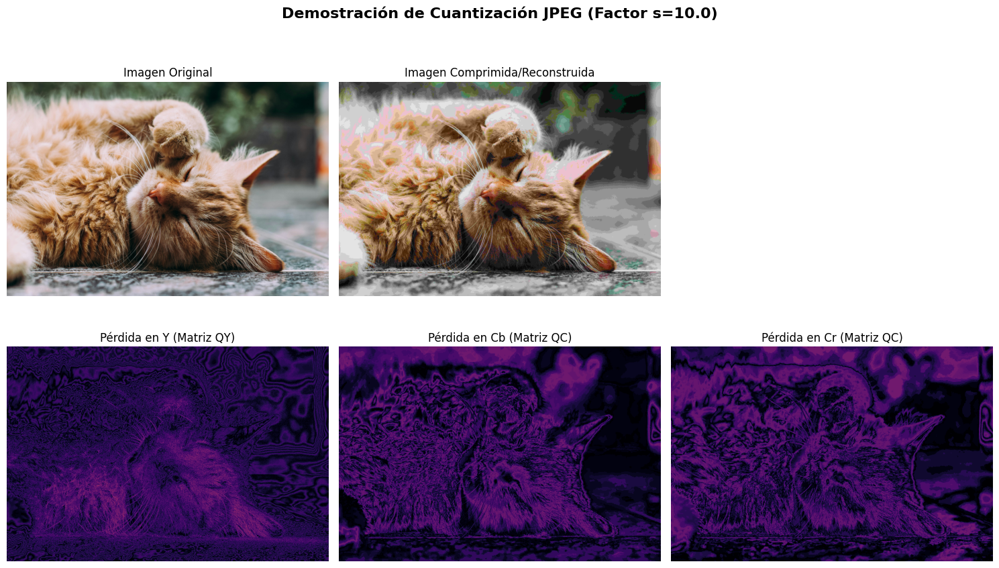

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

def cuantizacion_jpeg_demo(ruta_imagen, factor_s=1.0):
    # 1. Definir las matrices de cuantización del texto
    QY = np.array([
        [16, 11, 10, 16, 24, 40, 51, 61],
        [12, 12, 14, 19, 26, 58, 60, 55],
        [14, 13, 16, 24, 40, 57, 69, 56],
        [14, 17, 22, 29, 51, 87, 80, 62],
        [18, 22, 37, 56, 68, 109, 103, 77],
        [24, 35, 55, 64, 81, 104, 113, 92],
        [49, 64, 78, 87, 103, 121, 120, 101],
        [72, 92, 95, 98, 112, 100, 103, 99]
    ], dtype=np.float32)

    QC = np.array([
        [17, 18, 24, 47, 99, 99, 99, 99],
        [18, 21, 26, 66, 99, 99, 99, 99],
        [24, 26, 56, 99, 99, 99, 99, 99],
        [47, 66, 99, 99, 99, 99, 99, 99],
        [99, 99, 99, 99, 99, 99, 99, 99],
        [99, 99, 99, 99, 99, 99, 99, 99],
        [99, 99, 99, 99, 99, 99, 99, 99],
        [99, 99, 99, 99, 99, 99, 99, 99]
    ], dtype=np.float32)

    # Función interna para procesar un solo canal en bloques de 8x8
    def procesar_canal(canal, matriz_Q, s):
        h, w = canal.shape
        # Recortar para que las dimensiones sean múltiplos de 8
        h_pad = h - (h % 8)
        w_pad = w - (w % 8)
        canal = canal[:h_pad, :w_pad].astype(np.float32)
        
        Q_escalada = matriz_Q * s
        canal_reconstruido = np.zeros_like(canal)
        
        for i in range(0, h_pad, 8):
            for j in range(0, w_pad, 8):
                bloque = canal[i:i+8, j:j+8]
                
                # Paso 1: Centrar los valores en cero (restar 128)
                bloque_centrado = bloque - 128.0
                
                # Paso 2: Transformada Discreta de Coseno (DCT)
                F = cv2.dct(bloque_centrado)
                
                # Paso 3: Cuantización (Ecuaciones 93 a 95 del texto)
                F_hat = np.round(F / Q_escalada)
                
                # Paso 4: De-cuantización (Ecuaciones 96 a 98 del texto)
                F_tilde = F_hat * Q_escalada
                
                # Paso 5: DCT Inversa y volver a sumar 128
                bloque_idct = cv2.idct(F_tilde)
                canal_reconstruido[i:i+8, j:j+8] = bloque_idct + 128.0
                
        return np.clip(canal_reconstruido, 0, 255).astype(np.uint8), canal[:h_pad, :w_pad].astype(np.uint8)

    # 2. Cargar imagen y convertir a YCbCr
    img_bgr = cv2.imread(ruta_imagen)
    if img_bgr is None:
        print("Error al cargar la imagen.")
        return
    
    img_ycrcb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2YCrCb)
    Y, Cr, Cb = cv2.split(img_ycrcb)

    # 3. Procesar canales aplicando la teoría
    Y_rec, Y_orig = procesar_canal(Y, QY, factor_s)
    Cr_rec, Cr_orig = procesar_canal(Cr, QC, factor_s)
    Cb_rec, Cb_orig = procesar_canal(Cb, QC, factor_s)

    # 4. Calcular el ERROR (pérdida de información) amplificado para poder verlo
    # Usamos cv2.absdiff para ver la diferencia matemática entre el original y el reconstruido
    error_Y = cv2.absdiff(Y_orig, Y_rec) * 5  # x5 para que sea visible
    error_Cr = cv2.absdiff(Cr_orig, Cr_rec) * 5
    error_Cb = cv2.absdiff(Cb_orig, Cb_rec) * 5

    # 5. Reconstruir la imagen final a color
    img_rec_ycrcb = cv2.merge([Y_rec, Cr_rec, Cb_rec])
    img_rec_rgb = cv2.cvtColor(img_rec_ycrcb, cv2.COLOR_YCrCb2RGB)
    
    # Recortar la imagen original de referencia
    img_orig_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)[:Y_orig.shape[0], :Y_orig.shape[1]]

    # 6. Visualización
    fig, axes = plt.subplots(2, 3, figsize=(15, 9))
    fig.suptitle(f'Demostración de Cuantización JPEG (Factor s={factor_s})', fontsize=16, fontweight='bold')

    axes[0, 0].imshow(img_orig_rgb)
    axes[0, 0].set_title('Imagen Original')
    axes[0, 0].axis('off')

    axes[0, 1].imshow(img_rec_rgb)
    axes[0, 1].set_title('Imagen Comprimida/Reconstruida')
    axes[0, 1].axis('off')

    # Mapa de error de luminancia
    axes[1, 0].imshow(error_Y, cmap='inferno')
    axes[1, 0].set_title('Pérdida en Y (Matriz QY)')
    axes[1, 0].axis('off')

    # Mapa de error de crominancia
    axes[1, 1].imshow(error_Cb, cmap='inferno')
    axes[1, 1].set_title('Pérdida en Cb (Matriz QC)')
    axes[1, 1].axis('off')

    axes[1, 2].imshow(error_Cr, cmap='inferno')
    axes[1, 2].set_title('Pérdida en Cr (Matriz QC)')
    axes[1, 2].axis('off')

    # Limpiar el subplot vacío
    axes[0, 2].axis('off')

    plt.tight_layout()
    plt.subplots_adjust(top=0.9)
    plt.show()

# Ejecuta con el factor 's' (prueba ponerle s=2.0 o s=3.0 para ver cómo se rompe)
ruta = 'imagen_prueba_color.png'
cuantizacion_jpeg_demo(ruta, factor_s=10.0)

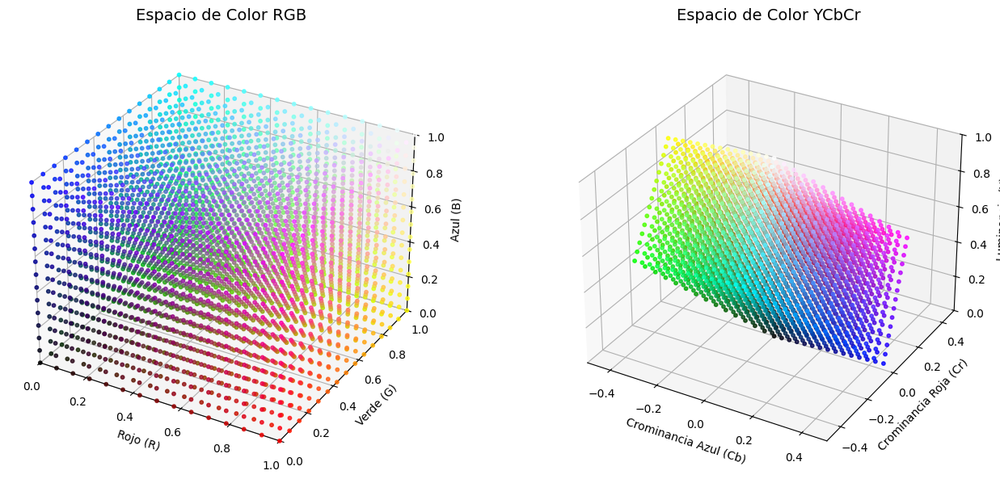

In [15]:
import numpy as np
import matplotlib.pyplot as plt


# 1. Generar una cuadrícula de puntos en el espacio RGB (valores de 0 a 1)
num_points = 15  # Ajusta esto para más o menos densidad de puntos
r = np.linspace(0, 1, num_points)
g = np.linspace(0, 1, num_points)
b = np.linspace(0, 1, num_points)

R, G, B = np.meshgrid(r, g, b)

# Aplanar las matrices para poder operar con ellas fácilmente
r_flat = R.flatten()
g_flat = G.flatten()
b_flat = B.flatten()

# Crear una matriz de colores MX3 para mapear el color real de cada punto en el gráfico
colors = np.vstack((r_flat, g_flat, b_flat)).T

# 2. Transformación matemática de RGB a YCbCr (según el estándar ITU-R BT.601)
# Y  =  0.299*R + 0.587*G + 0.114*B
# Cb = -0.1687*R - 0.3313*G + 0.5*B    (centrado en 0 para visualización limpia)
# Cr =  0.5*R - 0.4187*G - 0.0813*B    (centrado en 0 para visualización limpia)

Y = 0.299 * r_flat + 0.587 * g_flat + 0.114 * b_flat
Cb = -0.168736 * r_flat - 0.331264 * g_flat + 0.5 * b_flat
Cr = 0.5 * r_flat - 0.418688 * g_flat - 0.081312 * b_flat

# 3. Configurar la visualización en Matplotlib
fig = plt.figure(figsize=(14, 6))

# --- SUBPLOT 1: CUBO RGB ---
ax1 = fig.add_subplot(121, projection='3d')
ax1.scatter(r_flat, g_flat, b_flat, c=colors, marker='o', s=10, alpha=0.8)

ax1.set_title('Espacio de Color RGB', fontsize=14, pad=20)
ax1.set_xlabel('Rojo (R)')
ax1.set_ylabel('Verde (G)')
ax1.set_zlabel('Azul (B)')
ax1.set_xlim([0, 1])
ax1.set_ylim([0, 1])
ax1.set_zlim([0, 1])

# --- SUBPLOT 2: CUBO/SÓLIDO YCbCr ---
ax2 = fig.add_subplot(122, projection='3d')
ax2.scatter(Cb, Cr, Y, c=colors, marker='o', s=10, alpha=0.8)

ax2.set_title('Espacio de Color YCbCr', fontsize=14, pad=20)
ax2.set_xlabel('Crominancia Azul (Cb)')
ax2.set_ylabel('Crominancia Roja (Cr)')
ax2.set_zlabel('Luminancia (Y)')

# Ajustar límites de los ejes para YCbCr basados en los valores calculados
ax2.set_xlim([Cb.min(), Cb.max()])
ax2.set_ylim([Cr.min(), Cr.max()])
ax2.set_zlim([0, 1])

plt.tight_layout()
plt.show()

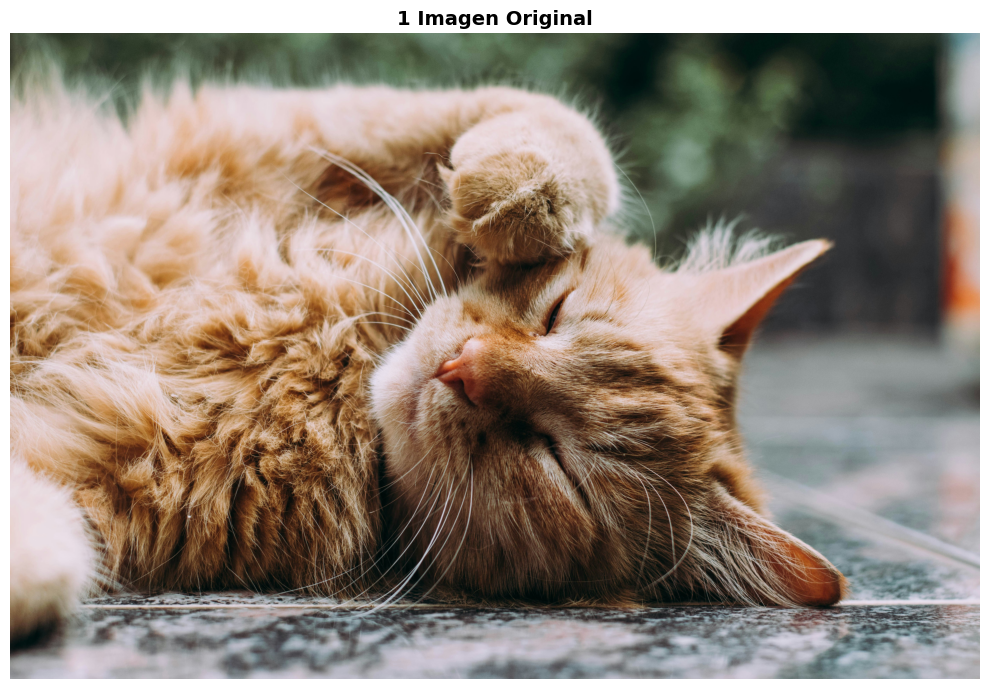

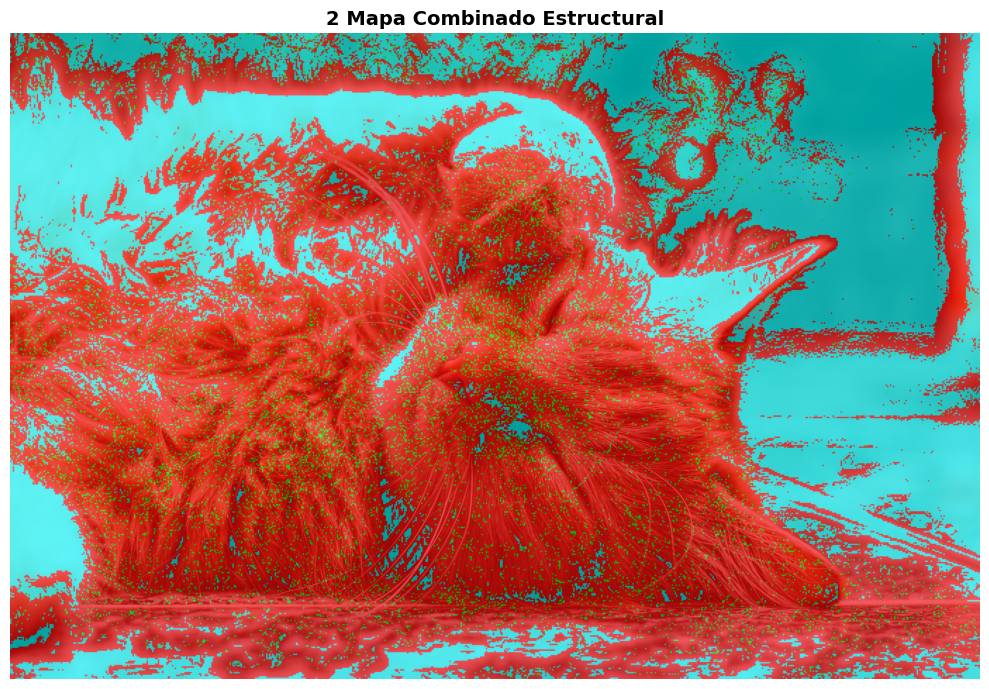

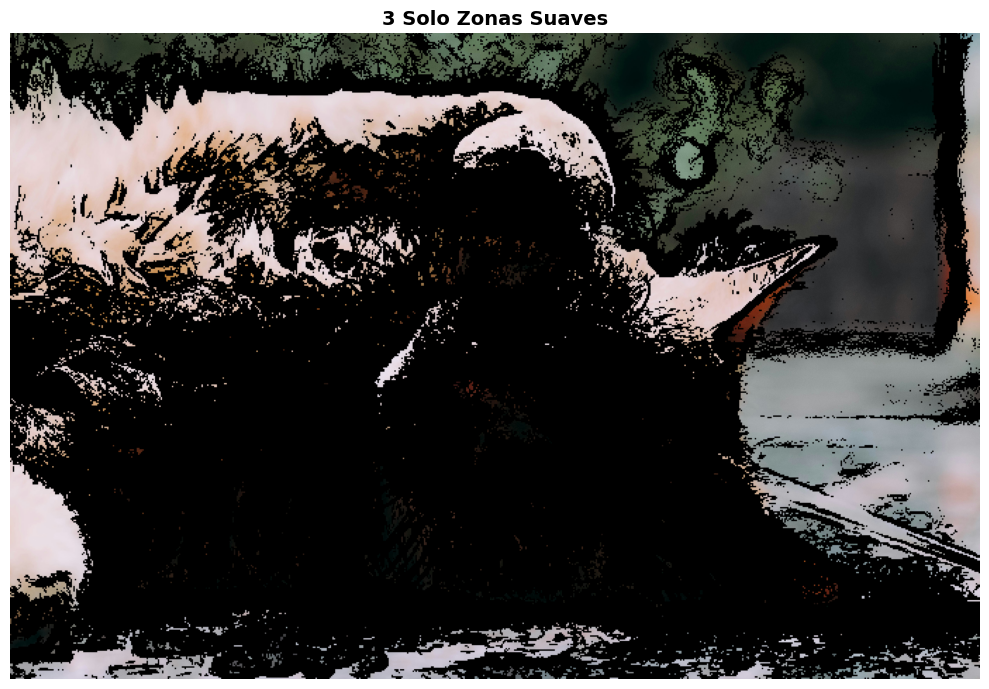

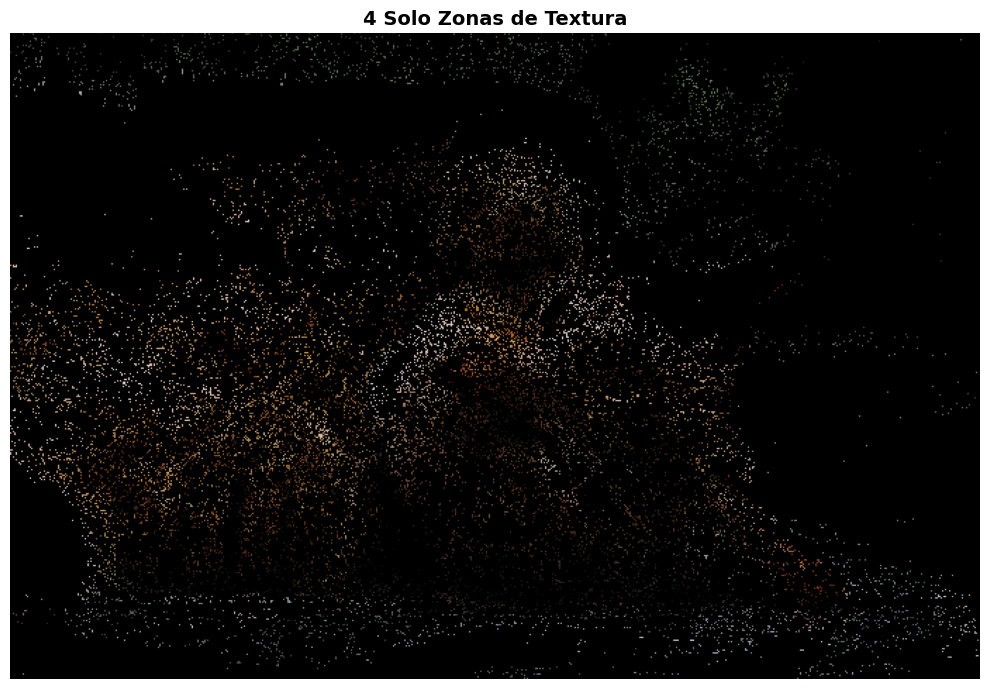

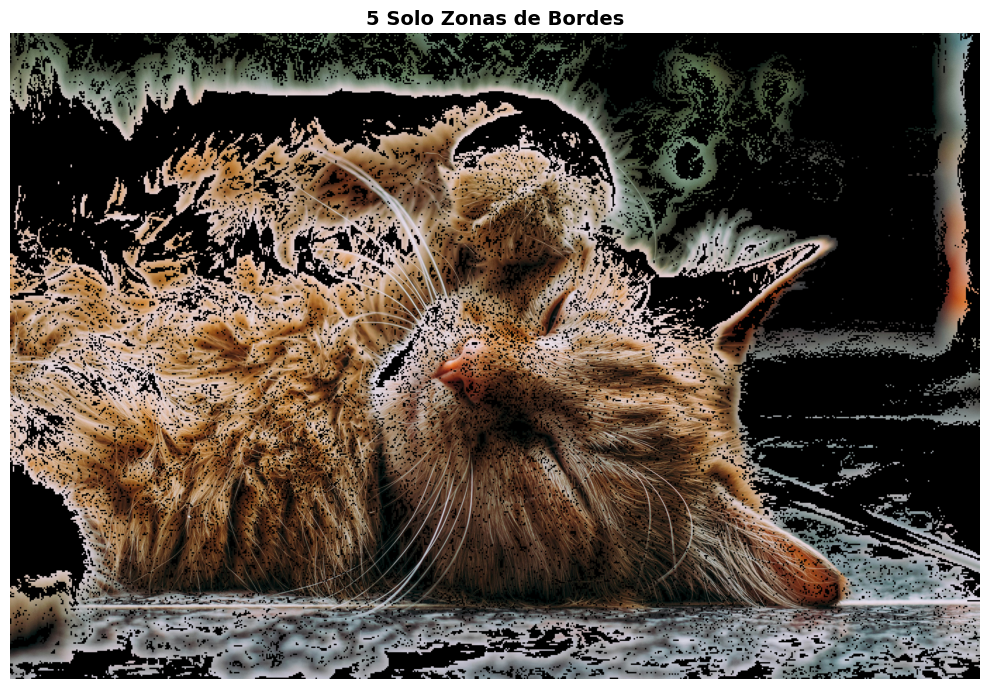

In [25]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

def clasificar_bloques_optimo(ruta_imagen):
    # 1. Cargar imagen y ajustar a múltiplos de 8
    img_bgr = cv2.imread(ruta_imagen)
    if img_bgr is None:
        print("Error al cargar la imagen.")
        return
        
    img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
    img_gray = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2GRAY)
    
    h, w = img_gray.shape
    h_pad = h - (h % 8)
    w_pad = w - (w % 8)
    
    img_gray = img_gray[:h_pad, :w_pad]
    img_rgb = img_rgb[:h_pad, :w_pad]

    # ---------------------------------------------------------------------
    # PASO CONSTANTE 1: Filtro Bilateral para aniquilar el ruido del pelo
    # ---------------------------------------------------------------------
    # d=11 (diámetro de vecindad), sigmaColor=90, sigmaSpace=90
    img_filtrada = cv2.bilateralFilter(img_gray, 11, 90, 90).astype(np.float64)

    # 2. Calcular gradientes de precisión con Sobel
    Gx = cv2.Sobel(img_filtrada, cv2.CV_64F, 1, 0, ksize=3)
    Gy = cv2.Sobel(img_filtrada, cv2.CV_64F, 0, 1, ksize=3)

    # 3. Componentes del Tensor de Estructura (Segundos Momentos)
    Ixx = Gx ** 2
    Iyy = Gy ** 2
    Ixy = Gx * Gy

    # Guardar métricas de cada bloque para análisis estadístico
    energias = []
    coherencias = []
    
    datos_bloques = {}

    # 4. Primer barrido: Calcular Tensor de Estructura por bloque
    for i in range(0, h_pad, 8):
        for j in range(0, w_pad, 8):
            # Promedios del tensor en el bloque de 8x8
            ixx = np.mean(Ixx[i:i+8, j:j+8])
            iyy = np.mean(Iyy[i:i+8, j:j+8])
            ixy = np.mean(Ixy[i:i+8, j:j+8])
            
            # Calcular analíticamente los Eigenvalues (Valores Propios) de la matriz [[ixx, ixy], [ixy, iyy]]
            trace = ixx + iyy
            det = ixx * iyy - ixy**2
            discriminante = np.sqrt(max(0.0, (trace / 2)**2 - det))
            
            l1 = trace / 2 + discriminante  # Mayor variación
            l2 = trace / 2 - discriminante  # Menor variación
            
            # Métrica 1: Energía total del bloque (Contraste)
            energia = l1 + l2
            # Métrica 2: Coherencia de orientación (Anisotropía)
            coherencia = (l1 - l2) / (l1 + l2 + 1e-5)
            
            energias.append(energia)
            coherencias.append(coherencia)
            datos_bloques[(i, j)] = (energia, coherencia)

    # Umbral adaptativo automático para separar zonas suaves (el 35% con menos contraste)
    T_suave = np.percentile(energias, 35)
    # Umbral estricto de coherencia: si tiende a 1 es una línea perfecta, si tiende a 0 es caos/textura
    T_borde = 0.45 

    # 5. Inicializar máscaras
    mask_suave = np.zeros((h_pad, w_pad), dtype=np.uint8)
    mask_borde = np.zeros((h_pad, w_pad), dtype=np.uint8)
    mask_textura = np.zeros((h_pad, w_pad), dtype=np.uint8)

    # 6. Segundo barrido: Clasificación matemática real
    for (i, j), (energia, coherencia) in datos_bloques.items():
        if energia < T_suave:
            mask_suave[i:i+8, j:j+8] = 1
        elif coherencia >= T_borde:
            mask_borde[i:i+8, j:j+8] = 1
        else:
            mask_textura[i:i+8, j:j+8] = 1

    # 7. Segmentar las imágenes usando los píxeles originales en RGB
    img_suave = cv2.bitwise_and(img_rgb, img_rgb, mask=mask_suave)
    img_borde = cv2.bitwise_and(img_rgb, img_rgb, mask=mask_borde)
    img_textura = cv2.bitwise_and(img_rgb, img_rgb, mask=mask_textura)

    # 8. Crear Mapa Combinado de visualización
    mapa_colores = np.zeros_like(img_rgb)
    mapa_colores[mask_suave == 1] = [0, 255, 255]    # Cyan = Suave
    mapa_colores[mask_borde == 1] = [255, 0, 0]      # Rojo = Bordes estructurales
    mapa_colores[mask_textura == 1] = [0, 255, 0]    # Verde = Texturas
    img_combinada = cv2.addWeighted(img_rgb, 0.4, mapa_colores, 0.6, 0)

    # -----------------------------------------------------------------
    # 9. Despliegue en Ventanas Independientes (Figuras Separadas)
    # -----------------------------------------------------------------
    salidas = [
        ("1_Imagen_Original", img_rgb),
        ("2_Mapa_Combinado_Estructural", img_combinada),
        ("3_Solo_Zonas_Suaves", img_suave),
        ("4_Solo_Zonas_de_Textura", img_textura),
        ("5_Solo_Zonas_de_Bordes", img_borde)
    ]

    for titulo, matriz in salidas:
        plt.figure(figsize=(10, 7))
        plt.imshow(matriz)
        plt.title(titulo.replace("_", " "), fontsize=14, fontweight='bold')
        plt.axis('off')
        plt.tight_layout()
        plt.show()

# Ejecución del algoritmo optimizado
ruta = 'imagen_prueba_color.png'
clasificar_bloques_optimo(ruta)

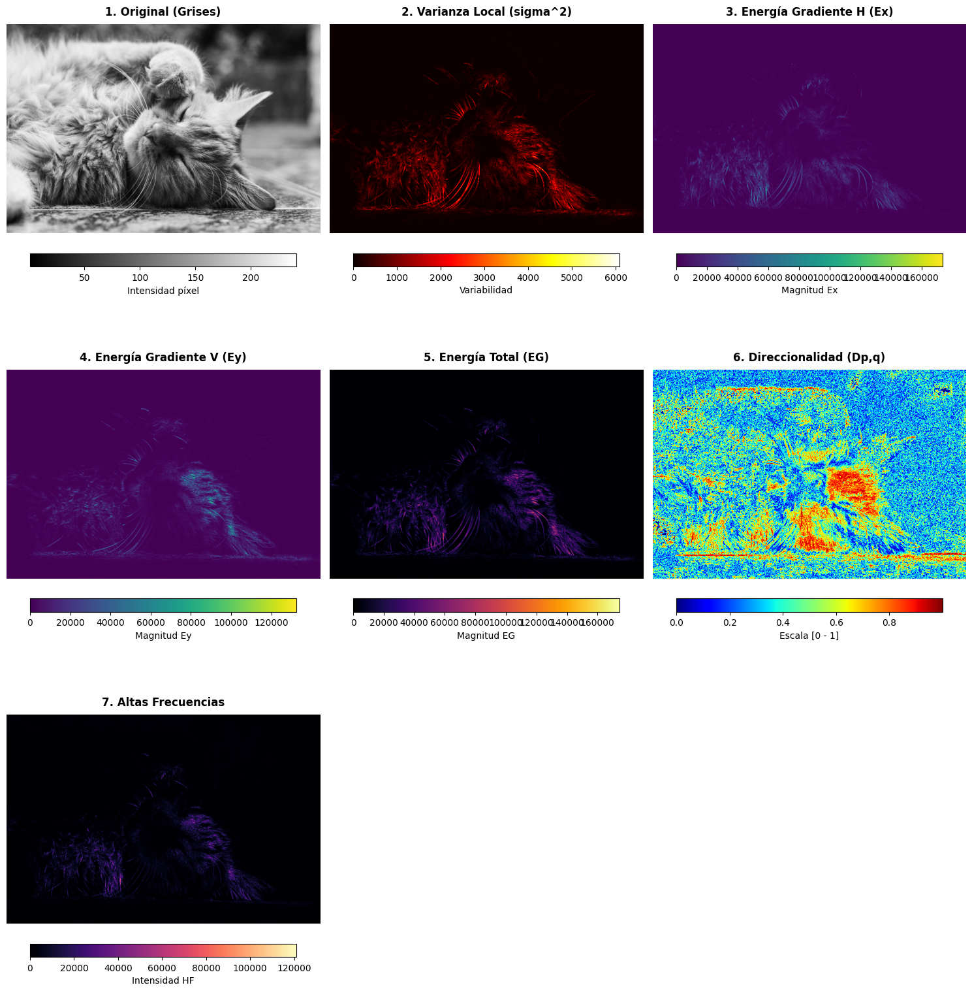

In [33]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

def analizar_medidas_locales_grid3x3(ruta_imagen):
    # 1. Cargar imagen en escala de grises y ajustar a múltiplos de 8
    img_bgr = cv2.imread(ruta_imagen)
    if img_bgr is None:
        print("Error al cargar la imagen.")
        return
        
    img_gray = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2GRAY)
    h, w = img_gray.shape
    h_pad = h - (h % 8)
    w_pad = w - (w % 8)
    
    img_gray = img_gray[:h_pad, :w_pad].astype(np.float64)

    # 2. Calcular gradientes FIR Sobel y altas frecuencias (Laplaciano)
    Gx = cv2.Sobel(img_gray, cv2.CV_64F, 1, 0, ksize=3)
    Gy = cv2.Sobel(img_gray, cv2.CV_64F, 0, 1, ksize=3)
    Laplaciano = cv2.Laplacian(img_gray, cv2.CV_64F, ksize=3)

    # 3. Inicializar matrices para los mapas de características
    mapa_varianza = np.zeros_like(img_gray)
    mapa_Ex = np.zeros_like(img_gray)
    mapa_Ey = np.zeros_like(img_gray)
    mapa_Eg = np.zeros_like(img_gray)
    mapa_D = np.zeros_like(img_gray)
    mapa_E_hf = np.zeros_like(img_gray)

    epsilon = 1e-5  

    # 4. Extracción de características bloque por bloque de 8x8
    for i in range(0, h_pad, 8):
        for j in range(0, w_pad, 8):
            bloque = img_gray[i:i+8, j:j+8]
            bloque_Gx = Gx[i:i+8, j:j+8]
            bloque_Gy = Gy[i:i+8, j:j+8]
            bloque_Lap = Laplaciano[i:i+8, j:j+8]

            # Media y Varianza (Ecuaciones 196 y 197)
            mu = np.mean(bloque)
            varianza = np.mean((bloque - mu) ** 2)

            # Energías de Gradiente (Ecuaciones 207, 208 y 209)
            Ex = np.mean(bloque_Gx ** 2)
            Ey = np.mean(bloque_Gy ** 2)
            Eg = Ex + Ey

            # Direccionalidad (Ecuación 210)
            D = abs(Ex - Ey) / (Ex + Ey + epsilon)

            # Energía de Altas Frecuencias
            E_hf = np.mean(bloque_Lap ** 2)

            # Asignar valores al bloque completo
            mapa_varianza[i:i+8, j:j+8] = varianza
            mapa_Ex[i:i+8, j:j+8] = Ex
            mapa_Ey[i:i+8, j:j+8] = Ey
            mapa_Eg[i:i+8, j:j+8] = Eg
            mapa_D[i:i+8, j:j+8] = D
            mapa_E_hf[i:i+8, j:j+8] = E_hf

    # -----------------------------------------------------------------
    # 5. Construcción de la Cuadrícula Vertical Ampliada (Grid 3x3)
    # -----------------------------------------------------------------
    # Definimos un tamaño de lienzo proporcional y alto (15x16 pulgadas)
    fig, axes = plt.subplots(3, 3, figsize=(15, 16))
    axes = axes.ravel()  # Aplanar la matriz de 3x3 a un vector de 9 posiciones

    medidas_visualizar = [
        ("1. Original (Grises)", img_gray, 'gray', "Intensidad píxel"),
        ("2. Varianza Local (sigma^2)", mapa_varianza, 'hot', "Variabilidad"),
        ("3. Energía Gradiente H (Ex)", mapa_Ex, 'viridis', "Magnitud Ex"),
        ("4. Energía Gradiente V (Ey)", mapa_Ey, 'viridis', "Magnitud Ey"),
        ("5. Energía Total (EG)", mapa_Eg, 'inferno', "Magnitud EG"),
        ("6. Direccionalidad (Dp,q)", mapa_D, 'jet', "Escala [0 - 1]"),
        ("7. Altas Frecuencias", mapa_E_hf, 'magma', "Intensidad HF")
    ]

    # Renderizar los 7 mapas disponibles
    for idx, (titulo, mapa, mapa_color, etiqueta) in enumerate(medidas_visualizar):
        im = axes[idx].imshow(mapa, cmap=mapa_color)
        axes[idx].set_title(titulo, fontsize=12, fontweight='bold', pad=10)
        axes[idx].axis('off')
        
        # Colorbar en posición horizontal abajo de cada imagen para ganar espacio vertical
        fig.colorbar(im, ax=axes[idx], orientation='horizontal', shrink=0.85, pad=0.06, label=etiqueta)

    # 6. Ocultar los cuadrantes sobrantes (posiciones indexadas 7 y 8)
    axes[7].axis('off')
    axes[8].axis('off')

    # Título principal y ajuste de márgenes
    plt.tight_layout()
    plt.show()

# Ejecución
ruta = 'imagen_prueba_color.png'  # Ruta de tu imagen
analizar_medidas_locales_grid3x3(ruta)

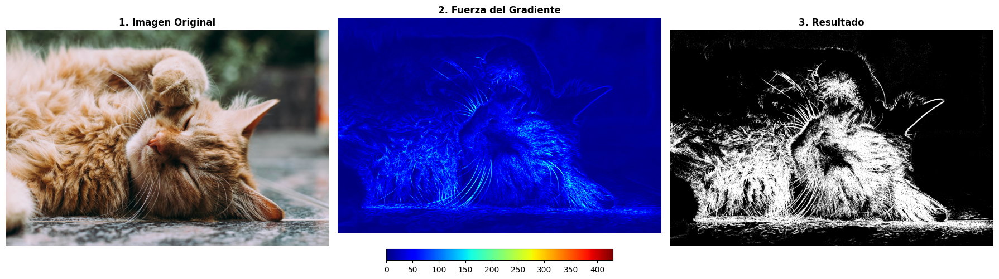

In [37]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

def detectar_bordes_con_silueta(ruta_imagen):
    # 1. Cargar imagen
    img_bgr = cv2.imread(ruta_imagen)
    if img_bgr is None:
        print("Error al cargar la imagen.")
        return
        
    img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
    img_gray = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2GRAY)
    
    # 2. Suavizado intermedio para homogeneizar
    img_blur = cv2.GaussianBlur(img_gray, (5, 5), 1.2)
    
    # 3. Componente 1: Laplaciano para los detalles internos y bigotes
    laplacian_64f = cv2.Laplacian(img_blur, cv2.CV_64F, ksize=3)
    laplacian_abs = cv2.convertScaleAbs(laplacian_64f)
    
    # 4. Componente 2: Gradientes de primer orden (Sobel)
    Gx = cv2.Sobel(img_blur, cv2.CV_64F, 1, 0, ksize=3)
    Gy = cv2.Sobel(img_blur, cv2.CV_64F, 0, 1, ksize=3)
    magnitud_gradiente = np.sqrt(Gx**2 + Gy**2)
    
    # -----------------------------------------------------------------
    # ESTRATEGIA DE EXTRACCIÓN DUAL
    # -----------------------------------------------------------------
    # Paso A: Extraer la SILUETA principal usando un percentil del gradiente.
    # El lomo y las orejas tienen una presencia ancha y continua aquí.
    umbral_silueta = np.percentile(magnitud_gradiente, 78)
    silueta_binaria = (magnitud_gradiente > umbral_silueta).astype(np.uint8) * 255
    
    # Paso B: Extraer los DETALLES finos filtrando el Laplaciano
    umbral_detalles = np.percentile(magnitud_gradiente, 45)
    detalles_binarios = np.zeros_like(laplacian_abs)
    detalles_binarios[(magnitud_gradiente > umbral_detalles) & (laplacian_abs > 20)] = 255
    
    # Paso C: FUSIÓN MÁXIMA (Unir la silueta estructural con el pelo/bigotes)
    bordes_totales = cv2.bitwise_or(silueta_binaria, detalles_binarios)
    
    # Limpieza final morfológica opcional para conectar líneas de la silueta
    kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (2, 2))
    bordes_finales = cv2.morphologyEx(bordes_totales, cv2.MORPH_CLOSE, kernel)

    # -----------------------------------------------------------------
    # 5. Despliegue Unificado (Panel 1x3)
    # -----------------------------------------------------------------
    fig, axes = plt.subplots(1, 3, figsize=(18, 6))
    
    # Panel 1: Original
    axes[0].imshow(img_rgb)
    axes[0].set_title("1. Imagen Original", fontsize=12, fontweight='bold')
    axes[0].axis('off')
    
    # Panel 2: Mapa de calor del Gradiente (donde vive la silueta)
    im_grad = axes[1].imshow(magnitud_gradiente, cmap='jet')
    axes[1].set_title("2. Fuerza del Gradiente", fontsize=12, fontweight='bold')
    axes[1].axis('off')
    fig.colorbar(im_grad, ax=axes[1], orientation='horizontal', shrink=0.7, pad=0.05)
    
    # Panel 3: Fusión Perfecta
    axes[2].imshow(bordes_finales, cmap='gray')
    axes[2].set_title("3. Resultado", fontsize=12, fontweight='bold')
    axes[2].axis('off')
    
    plt.tight_layout()
    plt.show()

# Ejecución
ruta = 'imagen_prueba_color.png'
detectar_bordes_con_silueta(ruta)

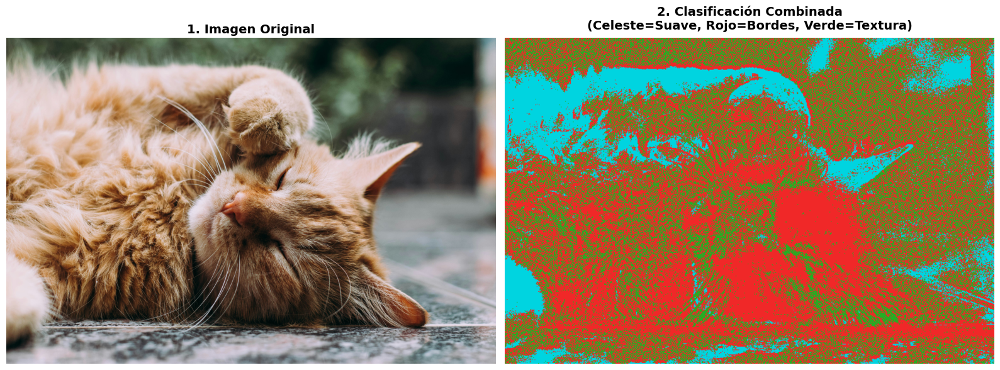

In [48]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

def clasificacion_bloques_perfecta(ruta_imagen):
    # 1. Cargar imagen y ajustar a la grilla estricta de 8x8
    img_bgr = cv2.imread(ruta_imagen)
    if img_bgr is None:
        print("Error al cargar la imagen.")
        return
        
    img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
    img_gray = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2GRAY)
    
    h, w = img_gray.shape
    h_pad = h - (h % 8)
    w_pad = w - (w % 8)
    
    img_gray = img_gray[:h_pad, :w_pad].astype(np.float64)
    img_rgb_cropped = img_rgb[:h_pad, :w_pad]

    # 2. Obtener gradientes directos sin pre-filtrado destructivo
    # Usamos Scharr o Sobel estándar; Sobel ksize=3 es el institucional
    Gx = cv2.Sobel(img_gray, cv2.CV_64F, 1, 0, ksize=3)
    Gy = cv2.Sobel(img_gray, cv2.CV_64F, 0, 1, ksize=3)

    # 3. Inicializar los mapas de almacenamiento
    mapa_Eg = np.zeros_like(img_gray)
    mapa_D = np.zeros_like(img_gray)
    epsilon = 1e-5

    # 4. Procesamiento por bloques B(p,q) de 8x8
    for i in range(0, h_pad, 8):
        for j in range(0, w_pad, 8):
            bloque_Gx = Gx[i:i+8, j:j+8]
            bloque_Gy = Gy[i:i+8, j:j+8]

            # Energías locales de gradiente
            Ex = np.mean(bloque_Gx ** 2)
            Ey = np.mean(bloque_Gy ** 2)
            Eg = Ex + Ey
            
            # Direccionalidad estricta D(p,q)
            D = abs(Ex - Ey) / (Ex + Ey + epsilon)

            mapa_Eg[i:i+8, j:j+8] = Eg
            mapa_D[i:i+8, j:j+8] = D

    # -----------------------------------------------------------------
    # CALIBRACIÓN DINÁMICA DE UMBRALES (Basado en la firma de tu imagen)
    # -----------------------------------------------------------------
    # Usamos un percentil bajo (15%) para el piso de energía, evitando que 
    # el pelaje opaque los bordes suaves del lomo contra el fondo desenfocado.
    umbral_energia = np.percentile(mapa_Eg, 15)
    
    # Bajamos levemente la exigencia angular (0.28) para que las curvas
    # del lomo y las orejas entren perfectamente en la categoría de Borde.
    umbral_direccionalidad = 0.28

    # 5. Construcción del mapa sintético cromático
    mapa_color = np.zeros((h_pad, w_pad, 3), dtype=np.uint8)

    # Paleta de color institucional de tu guía
    COLOR_SUAVE = [0, 212, 224]    # Celeste (Fondo liso / Zonas estables)
    COLOR_TEXTURA = [35, 175, 35]  # Verde (Pelaje / Omnidireccional)
    COLOR_BORDE = [240, 40, 40]    # Rojo (Siluetas y Contornos / Direccional)

    # Definición de máscaras lógicas
    mask_suave = mapa_Eg < umbral_energia
    mask_textura = (mapa_Eg >= umbral_energia) & (mapa_D < umbral_direccionalidad)
    mask_borde = (mapa_Eg >= umbral_energia) & (mapa_D >= umbral_direccionalidad)

    # Pintar lienzo
    mapa_color[mask_suave] = COLOR_SUAVE
    mapa_color[mask_textura] = COLOR_TEXTURA
    mapa_color[mask_borde] = COLOR_BORDE

    # -----------------------------------------------------------------
    # 6. Despliegue en Fila Unificada (1x2) - Maximización Vertical
    # -----------------------------------------------------------------
    fig, axes = plt.subplots(1, 2, figsize=(16, 9))
    
    axes[0].imshow(img_rgb_cropped)
    axes[0].set_title("1. Imagen Original", fontsize=14, fontweight='bold')
    axes[0].axis('off')
    
    axes[1].imshow(mapa_color)
    axes[1].set_title("2. Clasificación Combinada\n(Celeste=Suave, Rojo=Bordes, Verde=Textura)", 
                      fontsize=14, fontweight='bold', pad=10)
    axes[1].axis('off')
    

    plt.tight_layout()
    plt.show()

# Ejecución del algoritmo corregido
ruta = 'imagen_prueba_color.png'  # Usá el nombre de tu archivo cargado
clasificacion_bloques_perfecta(ruta)

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.ndimage import gaussian_filter

# ---------------------------------------------------------
# 1. GENERACIÓN DE UNA IMAGEN SINTÉTICA CORRELACIONADA
# ---------------------------------------------------------
# Generamos un patrón suave para simular las estadísticas de una imagen natural
np.random.seed(42)
x_coords, y_coords = np.meshgrid(np.arange(256), np.arange(256))
img_base = np.sin(x_coords / 35) * np.cos(y_coords / 35) + 0.6 * np.sin(x_coords / 15)
noise = np.random.randn(256, 256)
# Suavizamos el ruido para correlacionar espacialmente los píxeles vecinos (proceso AR(1) aproximado)
img = img_base + gaussian_filter(noise, sigma=2.0) * 0.4
# Normalizar a rango [0, 1]
img = (img - img.min()) / (img.max() - img.min())

# ---------------------------------------------------------
# 2. EXTRACCIÓN DE BLOQUES DE 8x8 Y CENTRADO DE DATOS
# ---------------------------------------------------------
block_size = 8
N = block_size * block_size  # 64 coeficientes por bloque
h, w = img.shape
blocks = []

for i in range(0, h, block_size):
    for j in range(0, w, block_size):
        block = img[i:i+block_size, j:j+block_size]
        if block.shape == (block_size, block_size):
            blocks.append(block.flatten())

X = np.array(blocks).T  # Matriz de datos de dimensión (64, M) donde M es el número de bloques
M = X.shape[1]

# Restamos la media para asegurar E{x} = 0 (requisito de la teoría KLT)
mean_vector = np.mean(X, axis=1, keepdims=True)
X_zero_mean = X - mean_vector

# ---------------------------------------------------------
# 3. CÁLCULO DE LA KLT (Basada en Autovectores de Covarianza)
# ---------------------------------------------------------
# Matriz de covarianza Rx (64x64)
Rx = np.cov(X_zero_mean)

# Diagonalización: obtenemos autovalores y autovectores
eigenvalues, U = np.linalg.eigh(Rx)

# Ordenamos de mayor a menor autovalor (orden de máxima varianza/energía)
idx_sort = np.argsort(eigenvalues)[::-1]
eigenvalues = eigenvalues[idx_sort]
U = U[:, idx_sort]  # U contiene los autovectores ortonormales en sus columnas

# Transformada KLT: y = U^T * x
Y_KLT = U.T @ X_zero_mean

# ---------------------------------------------------------
# 4. CÁLCULO DE LA DCT-II ORTONORMAL (Fija)
# ---------------------------------------------------------
# Generamos la matriz DCT de 1D de tamaño 8x8
C = np.zeros((block_size, block_size))
for i in range(block_size):
    for j in range(block_size):
        if i == 0:
            C[i, j] = 1.0 / np.sqrt(block_size)
        else:
            C[i, j] = np.sqrt(2.0 / block_size) * np.cos(np.pi * (2 * j + 1) * i / (2 * block_size))

# La transformación 2D para bloques aplanados se obtiene mediante el producto de Kronecker: A_DCT = C x C
A_DCT = np.kron(C, C)  # Matriz ortonormal de 64x64

# Transformada DCT: y = A_DCT * x
Y_DCT = A_DCT @ X_zero_mean

# Para la DCT, calculamos la varianza empírica de cada uno de sus 64 coeficientes
dct_variances = np.var(Y_DCT, axis=1)
# Ordenamos los coeficientes de la DCT por orden de varianza descendente
dct_idx_sort = np.argsort(dct_variances)[::-1]
dct_variances_sorted = dct_variances[dct_idx_sort]

# ---------------------------------------------------------
# 5. EVALUACIÓN DE COMPACTACIÓN Y ERROR DE RECONSTRUCCIÓN (MSE)
# ---------------------------------------------------------
# Energía acumulada normalizada (Suma acumulada de varianzas)
cum_energy_klt = np.cumsum(eigenvalues) / np.sum(eigenvalues)
cum_energy_dct = np.cumsum(dct_variances_sorted) / np.sum(dct_variances_sorted)

# Vectores para almacenar el MSE al reconstruir usando K coeficientes
mse_klt = []
mse_dct = []
K_values = np.arange(1, N + 1)

for K in K_values:
    # --- Reconstrucción KLT ---
    Y_KLT_trunc = np.zeros_like(Y_KLT)
    Y_KLT_trunc[:K, :] = Y_KLT[:K, :]  # Conservar solo los K primeros coeficientes
    X_rec_KLT = U @ Y_KLT_trunc + mean_vector
    mse_klt.append(np.mean((X - X_rec_KLT) ** 2))
    
    # --- Reconstrucción DCT ---
    Y_DCT_trunc = np.zeros_like(Y_DCT)
    # Conservar los K coeficientes con mayor varianza promedio
    Y_DCT_trunc[dct_idx_sort[:K], :] = Y_DCT[dct_idx_sort[:K], :]
    X_rec_DCT = A_DCT.T @ Y_DCT_trunc + mean_vector
    mse_dct.append(np.mean((X - X_rec_DCT) ** 2))

# ---------------------------------------------------------
# 6. RECONSTRUCCIÓN VISUAL DE UN BLOQUE EJEMPLO
# ---------------------------------------------------------
# Tomamos el bloque central para comparar visualmente
block_idx = M // 2 + 15
K_visual = 6  # Reconstrucción ultra agresiva con solo 6 de 64 coeficientes

# KLT truncada
Y_KLT_trunc_vis = np.zeros_like(Y_KLT[:, block_idx])
Y_KLT_trunc_vis[:K_visual] = Y_KLT[:K_visual, block_idx]
rec_klt_block = (U @ Y_KLT_trunc_vis + mean_vector[:, 0]).reshape(block_size, block_size)

# DCT truncada
Y_DCT_trunc_vis = np.zeros_like(Y_DCT[:, block_idx])
Y_DCT_trunc_vis[dct_idx_sort[:K_visual]] = Y_DCT[dct_idx_sort[:K_visual], block_idx]
rec_dct_block = (A_DCT.T @ Y_DCT_trunc_vis + mean_vector[:, 0]).reshape(block_size, block_size)

orig_block = X[:, block_idx].reshape(block_size, block_size)

# ---------------------------------------------------------
# 7. GRÁFICOS
# ---------------------------------------------------------
plt.figure(figsize=(14, 10))

# Subplot 1: La imagen utilizada
plt.subplot(2, 2, 1)
plt.imshow(img, cmap='gray')
plt.title("Imagen Original Altamente Correlacionada")
plt.axis('off')

# Subplot 2: Curva de Compactación de Energía
plt.subplot(2, 2, 2)
plt.plot(K_values, cum_energy_klt, label='KLT (Óptima dependiente de datos)', color='blue', linewidth=2)
plt.plot(K_values, cum_energy_dct, label='DCT-II (Fija)', color='red', linestyle='--', linewidth=2)
plt.xlabel('Número de Coeficientes Conservados (K)')
plt.ylabel('Fracción de Energía Total Conservada')
plt.title('Compactación de Energía (Varianza Acumulada)')
plt.grid(True)
plt.legend()

# Subplot 3: Curva de Error Cuadrático Medio (MSE)
plt.subplot(2, 2, 3)
plt.plot(K_values, mse_klt, label='KLT', color='blue', linewidth=2)
plt.plot(K_values, mse_dct, label='DCT-II', color='red', linestyle='--', linewidth=2)
plt.xlabel('Número de Coeficientes Conservados (K)')
plt.ylabel('Error Cuadrático Medio (MSE)')
plt.title('Error de Reconstrucción vs. Coeficientes')
plt.grid(True)
plt.legend()

# Subplot 4: Reconstrucción Visual de un bloque
plt.subplot(2, 2, 4)
fig_blocks = np.hstack([orig_block, rec_klt_block, rec_dct_block])
plt.imshow(fig_blocks, cmap='gray')
plt.title(f"Visual (Bloque 8x8): Original | KLT (K={K_visual}) | DCT (K={K_visual})")
plt.axis('off')

plt.tight_layout()
plt.show()